In [1]:
import numpy as np
import pandas as pd
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import time
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import shutil
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
tf.keras.backend.clear_session()

In [3]:
#%pip install tensorflow==2.9.1

import tensorflow as tf
print(tf. __version__)

2.12.0


In [4]:
#data_directory = r'../../../Dataset/UsedDataset/DiseasedPlants/Pertanian/Jagung'
data_directory = r'/kaggle/input/agronify-dataset/DiseasedPlants/Perkebunan/Kentang'

min_samples = 100

filepaths = []
labels = []
class_list = os.listdir(data_directory)

for class_name in class_list:
    class_path = os.path.join(data_directory, class_name)
    file_list = os.listdir(class_path)

    if len(file_list) >= min_samples:
        for file_name in file_list:
            file_path = os.path.join(class_path, file_name)
            filepaths.append(file_path)
            labels.append(class_name)
    else:
        print('Class', class_name,
              'has only', len(file_list),
              'samples and will not be included in the dataframe')

filepaths_series = pd.Series(filepaths, name='filepaths')
labels_series = pd.Series(labels, name='labels')
df = pd.concat([filepaths_series, labels_series], axis=1)

train_df, dummy_df = train_test_split(df,
                                      train_size=0.8,
                                      shuffle=True,
                                      random_state=42,
                                      stratify=df['labels'])
valid_df, test_df = train_test_split(dummy_df,
                                     train_size=0.5,
                                     shuffle=True,
                                     random_state=42,
                                     stratify=dummy_df['labels'])

print('train_df length:', len(train_df),
      'test_df length:', len(test_df),
      'valid_df length:', len(valid_df))

classes = sorted(list(train_df['labels'].unique()))
class_count = len(classes)
print('The number of classes in the dataset is:', class_count)

groups = train_df.groupby('labels')
print('{0:^30s} {1:^13s}'.format('CLASS', 'IMAGE COUNT'))

count_list = []
class_list = []

for label in sorted(list(train_df['labels'].unique())):
    group = groups.get_group(label)
    count_list.append(len(group))
    class_list.append(label)
    print('{0:^30s} {1:^13s}'.format(label, str(len(group))))

max_value = np.max(count_list)
max_index = count_list.index(max_value)
max_class = class_list[max_index]

min_value = np.min(count_list)
min_index = count_list.index(min_value)
min_class = class_list[min_index]

print(max_class, 'has the most images:', max_value, ',',
      min_class, 'has the least images:', min_value)

height_total = 0
width_total = 0
train_df_sample = train_df.sample(n=100, random_state=123, axis=0)

for i in range(len(train_df_sample)):
    file_path = train_df_sample['filepaths'].iloc[i]
    img = plt.imread(file_path)
    shape = img.shape
    height_total += shape[0]
    width_total += shape[1]

print('Average height:', height_total // 100,
      'Average width:', width_total // 100,
      'Aspect ratio:', height_total / width_total)

train_df length: 1872 test_df length: 235 valid_df length: 234
The number of classes in the dataset is: 3
            CLASS               IMAGE COUNT 
     Potato__early_blight           876     
       Potato__healthy              122     
     Potato__late_blight            874     
Potato__early_blight has the most images: 876 , Potato__healthy has the least images: 122
Average height: 288 Average width: 306 Aspect ratio: 0.9409292323732569


In [5]:
def balance_dataframe(dataframe, target_samples, working_directory, image_size):
    dataframe = dataframe.copy()
    print('Initial length of the dataframe is', len(dataframe))
    augmented_directory = os.path.join(working_directory, 'aug')

    if os.path.isdir(augmented_directory):
        shutil.rmtree(augmented_directory)
    os.mkdir(augmented_directory)

    for label in dataframe['labels'].unique():
        class_directory = os.path.join(augmented_directory, label)
        os.mkdir(class_directory)

    total_augmented = 0
    image_generator = ImageDataGenerator(horizontal_flip=True,
                                         rotation_range=20,
                                         width_shift_range=.2,
                                         height_shift_range=.2,
                                         zoom_range=.2, 
                                         brightness_range=[0.15, 2.0],
                                         shear_range=0.15,
                                         vertical_flip=True,
                                         fill_mode="reflect")
    groups = dataframe.groupby('labels')

    for label in dataframe['labels'].unique():
        group = groups.get_group(label)
        sample_count = len(group)

        if sample_count < target_samples:
            delta = target_samples - sample_count
            target_directory = os.path.join(augmented_directory, label)
            msg='{0:40s} for class {1:^30s} creating {2:^5s} augmented images'.format(' ', label, str(delta))
            #msg = 'Creating {0} augmented images for class {1}'.format(delta, label)
            print(msg, '\r', end='')

            augmentation_generator = image_generator.flow_from_dataframe(group,
                                                                         x_col='filepaths',
                                                                         y_col=None,
                                                                         target_size=image_size,
                                                                         class_mode=None,
                                                                         batch_size=1,
                                                                         shuffle=False,
                                                                         save_to_dir=target_directory,
                                                                         save_prefix='aug-',
                                                                         color_mode='rgb',
                                                                         save_format='jpg')

            augmented_image_count = 0

            while augmented_image_count < delta:
                images = next(augmentation_generator)
                augmented_image_count += len(images)

            total_augmented += augmented_image_count

    print('Total augmented images created:', total_augmented)

    augmented_filepaths = []
    augmented_labels = []
    class_list = os.listdir(augmented_directory)

    for class_name in class_list:
        class_path = os.path.join(augmented_directory, class_name)
        file_list = os.listdir(class_path)

        for file_name in file_list:
            file_path = os.path.join(class_path, file_name)
            augmented_filepaths.append(file_path)
            augmented_labels.append(class_name)

    augmented_filepaths_series = pd.Series(augmented_filepaths, name='filepaths')
    augmented_labels_series = pd.Series(augmented_labels, name='labels')
    augmented_df = pd.concat([augmented_filepaths_series, augmented_labels_series], axis=1)

    dataframe = pd.concat([dataframe, augmented_df], axis=0).reset_index(drop=True)
    print('Length of augmented dataframe is now', len(dataframe))

    return dataframe


target_samples = max_value + 200
working_directory = r'./'
image_size = (224, 224)
train_df = balance_dataframe(train_df, target_samples, working_directory, image_size)

Initial length of the dataframe is 1872
Found 122 validated image filenames.     for class        Potato__healthy         creating  954  augmented images 
Found 874 validated image filenames.     for class      Potato__late_blight       creating  202  augmented images 
Found 876 validated image filenames.     for class      Potato__early_blight      creating  200  augmented images 
Total augmented images created: 1356
Length of augmented dataframe is now 3228


In [6]:
train_batch_size = 20
train_data_generator = ImageDataGenerator(horizontal_flip=True,
                                          rotation_range=20,
                                          width_shift_range=.2,
                                          height_shift_range=.2,
                                          zoom_range=.2)
t_and_v_data_generator = ImageDataGenerator()

train_message = '{0:70s} for train generator'.format(' ')
print(train_message, '\r', end='')

train_generator = train_data_generator.flow_from_dataframe(train_df,
                                                           x_col='filepaths',
                                                           y_col='labels',
                                                           target_size=image_size,
                                                           class_mode='categorical',
                                                           color_mode='rgb',
                                                           shuffle=True,
                                                           batch_size=train_batch_size)

valid_message = '{0:70s} for valid generator'.format(' ')
print(valid_message, '\r', end='')

valid_generator = t_and_v_data_generator.flow_from_dataframe(valid_df,
                                                             x_col='filepaths',
                                                             y_col='labels',
                                                             target_size=image_size,
                                                             class_mode='categorical',
                                                             color_mode='rgb',
                                                             shuffle=False,
                                                             batch_size=train_batch_size)

test_length = len(test_df)
test_batch_size = sorted([int(test_length/n) for n in range(1, test_length+1) if test_length % n == 0 and test_length/n <= 80], reverse=True)[0]
test_steps = int(test_length / test_batch_size)

test_message = '{0:70s} for test generator'.format(' ')
print(test_message, '\r', end='')

test_generator = t_and_v_data_generator.flow_from_dataframe(test_df,
                                                            x_col='filepaths',
                                                            y_col='labels',
                                                            target_size=image_size,
                                                            class_mode='categorical',
                                                            color_mode='rgb',
                                                            shuffle=False,
                                                            batch_size=test_batch_size)

classes = list(train_generator.class_indices.keys())
class_indices = list(train_generator.class_indices.values())
class_count = len(classes)
labels = test_generator.labels

print('test batch size:', test_batch_size, '  test steps:', test_steps, 'number of classes:', class_count)

Found 3228 validated image filenames belonging to 3 classes.           for train generator 
Found 234 validated image filenames belonging to 3 classes.            for valid generator 
Found 235 validated image filenames belonging to 3 classes.            for test generator 
test batch size: 47   test steps: 5 number of classes: 3


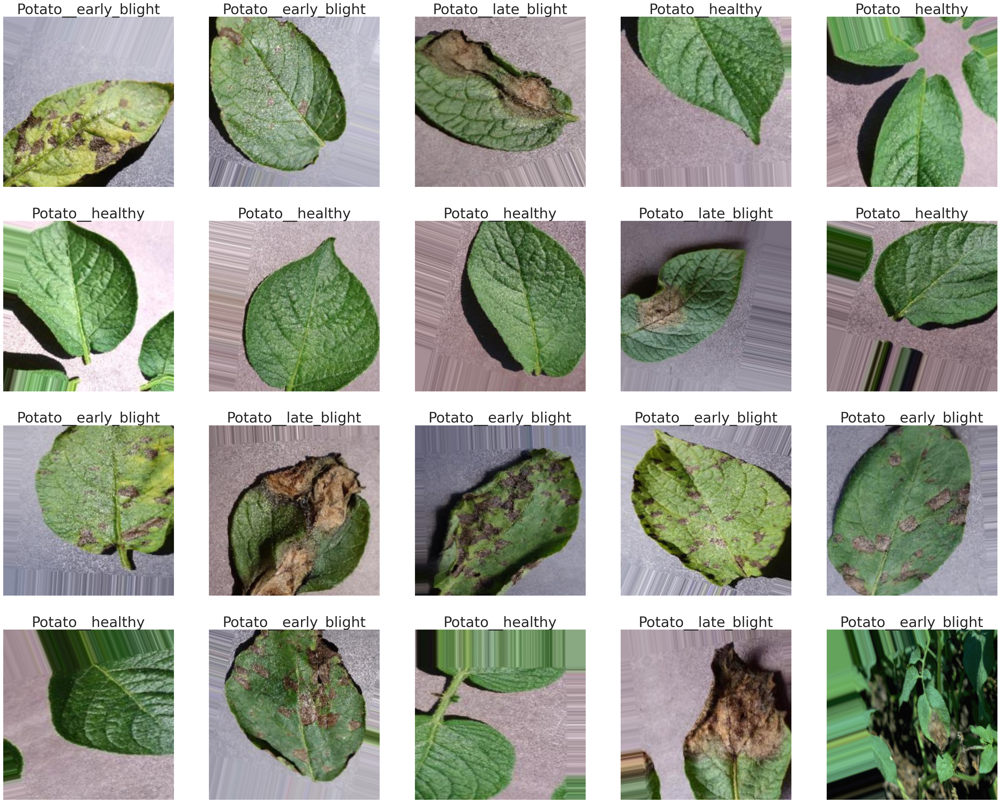

In [7]:
def show_image_samples(data_generator):
    class_dict = data_generator.class_indices
    classes = list(class_dict.keys())
    images, labels = next(data_generator)
    plt.figure(figsize=(40, 40))
    length = len(labels)
    if length < 25:
        r = length
    else:
        r = 25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        index = np.argmax(labels[i])
        class_name = classes[index]
        plt.title(class_name, fontsize=32)
        plt.axis('off')
    plt.show()

show_image_samples(train_generator)

In [8]:
class LR_ASK(keras.callbacks.Callback):
    def __init__(self, model, total_epochs, ask_epoch):
        super(LR_ASK, self).__init__()
        self.model = model
        self.ask_epoch = ask_epoch
        self.total_epochs = total_epochs
        self.ask = True
        self.lowest_val_loss = np.inf
        self.best_weights = self.model.get_weights()
        self.best_epoch = 1

    def on_train_begin(self, logs=None):
        if self.ask_epoch == 0:
            print('You set ask_epoch = 0, ask_epoch will be set to 1', flush=True)
            self.ask_epoch = 1
        if self.ask_epoch >= self.total_epochs:
            print('ask_epoch >= total_epochs, will train for', self.total_epochs, 'epochs', flush=True)
            self.ask = False
        if self.total_epochs == 1:
            self.ask = False
        else:
            print('Training will proceed until epoch', self.ask_epoch, 'then you will be asked to')
            print('enter H to halt training or enter an integer for how many more epochs to run then be asked again')
        self.start_time = time.time()

    def on_train_end(self, logs=None):
        print('Loading model with weights from epoch', self.best_epoch)
        self.model.set_weights(self.best_weights)
        training_duration = time.time() - self.start_time
        hours = training_duration // 3600
        minutes = (training_duration - (hours * 3600)) // 60
        seconds = training_duration - ((hours * 3600) + (minutes * 60))
        msg = f'Training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg, flush=True)

    def on_epoch_end(self, epoch, logs=None):
        val_loss = logs.get('val_loss')
        if val_loss < self.lowest_val_loss:
            self.lowest_val_loss = val_loss
            self.best_weights = self.model.get_weights()
            self.best_epoch = epoch + 1
            print(f'\nValidation loss of {val_loss:7.4f} is below the lowest loss, saving weights from epoch {str(epoch + 1):3s} as the best weights')
        else:
            print(f'\nValidation loss of {val_loss:7.4f} is above the lowest loss of {self.lowest_val_loss:7.4f}, keeping weights from epoch {str(self.best_epoch)} as the best weights')

        if self.ask:
            if epoch + 1 == self.ask_epoch:
                print('\nEnter H to end training or an integer for the number of additional epochs to run then ask again')
                ans = input()

                if ans.lower() == 'h' or ans == '0':
                    print('You entered', ans, 'Training halted on epoch', epoch + 1, 'due to user input\n', flush=True)
                    self.model.stop_training = True
                else:
                    self.ask_epoch += int(ans)
                    if self.ask_epoch > self.total_epochs:
                        print('\nYou specified a maximum of', self.total_epochs, 'epochs. Cannot train for', self.ask_epoch, flush=True)
                    else:
                        print('You entered', ans, 'Training will continue to epoch', self.ask_epoch, flush=True)
                        current_lr = float(tf.keras.backend.get_value(self.model.optimizer.lr))
                        print(f'Current learning rate is {current_lr:7.5f}.')

In [9]:
tf.keras.backend.clear_session()

In [10]:
from tensorflow.keras.applications import MobileNet

image_shape = (image_size[0], image_size[1], 3)
model_name = 'MobileNet'
base_model = MobileNet(
    include_top=False,
    input_shape=image_shape,
    pooling='max',
    weights='imagenet'
)

# Set base_model to be trainable
base_model.trainable = True

x = base_model.output
x = Flatten()(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(64,
          kernel_regularizer=regularizers.l2(l=0.016),
          activity_regularizer=regularizers.l1(0.006),
          bias_regularizer=regularizers.l1(0.006),
          activation='relu')(x)
x = Dropout(rate=0.5, seed=42)(x)
output = Dense(class_count, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=output)

model.compile(
    Adamax(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


17225924/17225924 [==============================] - 1s 0us/step


In [11]:
total_epochs = 50
ask_epoch = 10
ask_callback = LR_ASK(model,
                      total_epochs,
                      ask_epoch)
rlronp_callback = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
                                                       patience=2,
                                                       verbose=1)


tensorboard_callback = tf.keras.callbacks.TensorBoard("logs")

callbacks = [rlronp_callback, ask_callback,tensorboard_callback]
#callbacks = [ask_callback]

In [12]:
training_history = model.fit(x=train_generator,
                             epochs=total_epochs,
                             verbose=1,
                             callbacks=callbacks,
                             validation_data=valid_generator,
                             shuffle=False,
                             initial_epoch=0)

Training will proceed until epoch 10 then you will be asked to
enter H to halt training or enter an integer for how many more epochs to run then be asked again
Epoch 1/50
162/162 [==============================] - ETA: 0s - loss: 2.8416 - accuracy: 0.3522
Validation loss of  2.2555 is below the lowest loss, saving weights from epoch 1   as the best weights
162/162 [==============================] - 72s 304ms/step - loss: 2.8416 - accuracy: 0.3522 - val_loss: 2.2555 - val_accuracy: 0.4701 - lr: 0.0010
Epoch 2/50
162/162 [==============================] - ETA: 0s - loss: 2.5226 - accuracy: 0.3358
Validation loss of  2.0286 is below the lowest loss, saving weights from epoch 2   as the best weights
162/162 [==============================] - 40s 250ms/step - loss: 2.5226 - accuracy: 0.3358 - val_loss: 2.0286 - val_accuracy: 0.4701 - lr: 0.0010
Epoch 3/50
162/162 [==============================] - ETA: 0s - loss: 2.2825 - accuracy: 0.3398
Validation loss of  1.8859 is below the lowest loss,

 30


You entered 30 Training will continue to epoch 40
Current learning rate is 0.00100.
162/162 [==============================] - 264s 2s/step - loss: 1.3354 - accuracy: 0.4207 - val_loss: 1.2297 - val_accuracy: 0.4744 - lr: 0.0010
Epoch 11/50
162/162 [==============================] - ETA: 0s - loss: 1.2323 - accuracy: 0.5173
Validation loss of  1.1235 is below the lowest loss, saving weights from epoch 11  as the best weights
162/162 [==============================] - 41s 255ms/step - loss: 1.2323 - accuracy: 0.5173 - val_loss: 1.1235 - val_accuracy: 0.4701 - lr: 0.0010
Epoch 12/50
162/162 [==============================] - ETA: 0s - loss: 1.0745 - accuracy: 0.6112
Validation loss of  1.1198 is below the lowest loss, saving weights from epoch 12  as the best weights
162/162 [==============================] - 41s 251ms/step - loss: 1.0745 - accuracy: 0.6112 - val_loss: 1.1198 - val_accuracy: 0.4915 - lr: 0.0010
Epoch 13/50
162/162 [==============================] - ETA: 0s - loss: 0.9335

 H


You entered H Training halted on epoch 40 due to user input

162/162 [==============================] - 137s 849ms/step - loss: 0.2086 - accuracy: 0.9777 - val_loss: 0.2113 - val_accuracy: 0.9615 - lr: 1.0000e-08
Loading model with weights from epoch 31
Training elapsed time was 0.0 hours, 38.0 minutes, 56.13 seconds)


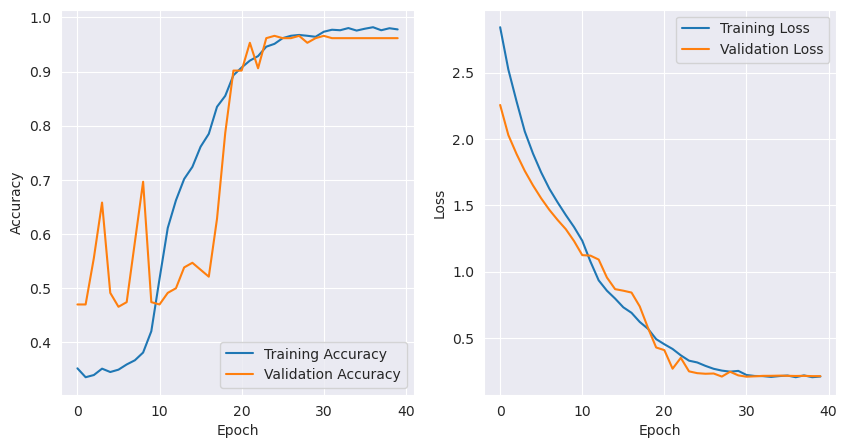

In [13]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(training_history.history['accuracy'], label='Training Accuracy')
plt.plot(training_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(training_history.history['loss'], label='Training Loss')
plt.plot(training_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

5/5 [==============================] - 2s 291ms/step
There were 4 errors in 235 tests for an accuracy of  98.30


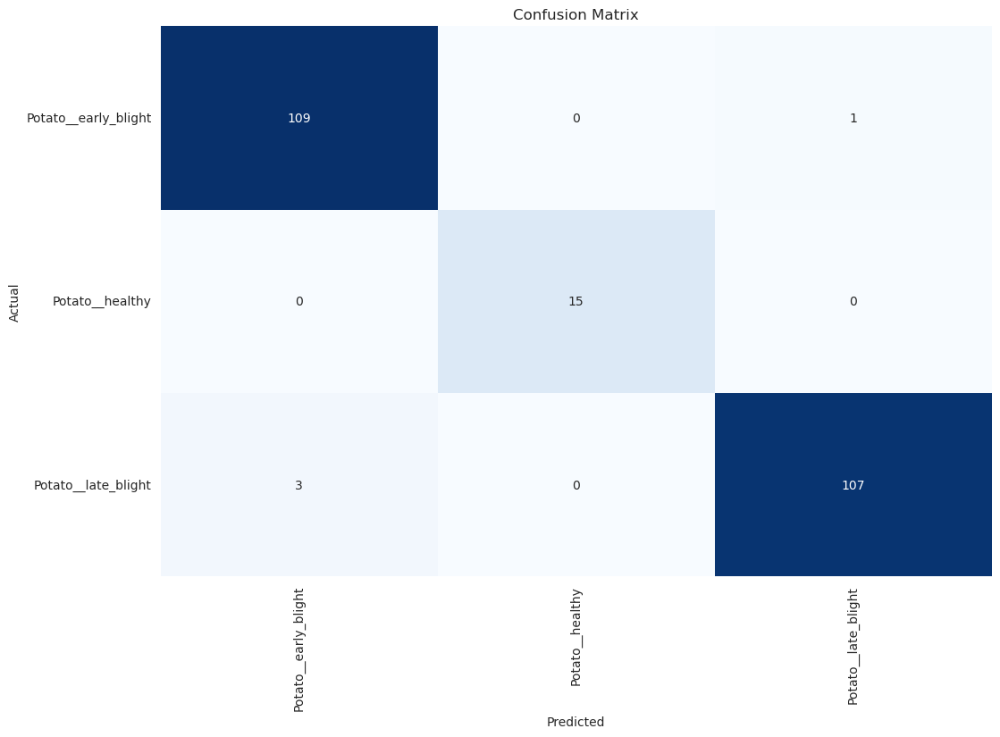

Classification Report:
----------------------
                       precision    recall  f1-score   support

Potato__early_blight     0.9732    0.9909    0.9820       110
     Potato__healthy     1.0000    1.0000    1.0000        15
 Potato__late_blight     0.9907    0.9727    0.9817       110

            accuracy                         0.9830       235
           macro avg     0.9880    0.9879    0.9879       235
        weighted avg     0.9831    0.9830    0.9830       235



In [14]:
def prediction_evaluation(test_gen, test_steps):
    y_pred = []
    y_true = test_gen.labels
    classes = list(test_gen.class_indices.keys())
    class_count = len(classes)
    error_count = 0
    preds = model.predict(test_gen, verbose=1)
    tests = len(preds)

    for i, p in enumerate(preds):
        pred_index = np.argmax(p)
        true_index = test_gen.labels[i]  # labels are integer values
        if pred_index != true_index:  # a misclassification has occurred
            error_count += 1
        y_pred.append(pred_index)

    accuracy = (1 - error_count / tests) * 100
    print(f'There were {error_count} errors in {tests} tests for an accuracy of {accuracy:6.2f}')
    y_pred = np.array(y_pred)
    y_true = np.array(y_true)

    if class_count <= 30:
        confusion_mat = confusion_matrix(y_true, y_pred)
        # plot the confusion matrix
        plt.figure(figsize=(12, 8))
        sns.heatmap(confusion_mat, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
        plt.xticks(np.arange(class_count) + .5, classes, rotation=90)
        plt.yticks(np.arange(class_count) + .5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()

    classification_rep = classification_report(y_true, y_pred, target_names=classes, digits=4)  # create classification report
    print("Classification Report:\n----------------------\n", classification_rep)
    return error_count, tests

errors, tests = prediction_evaluation(test_generator, test_steps)

2/2 [==============================] - 1s 168ms/step


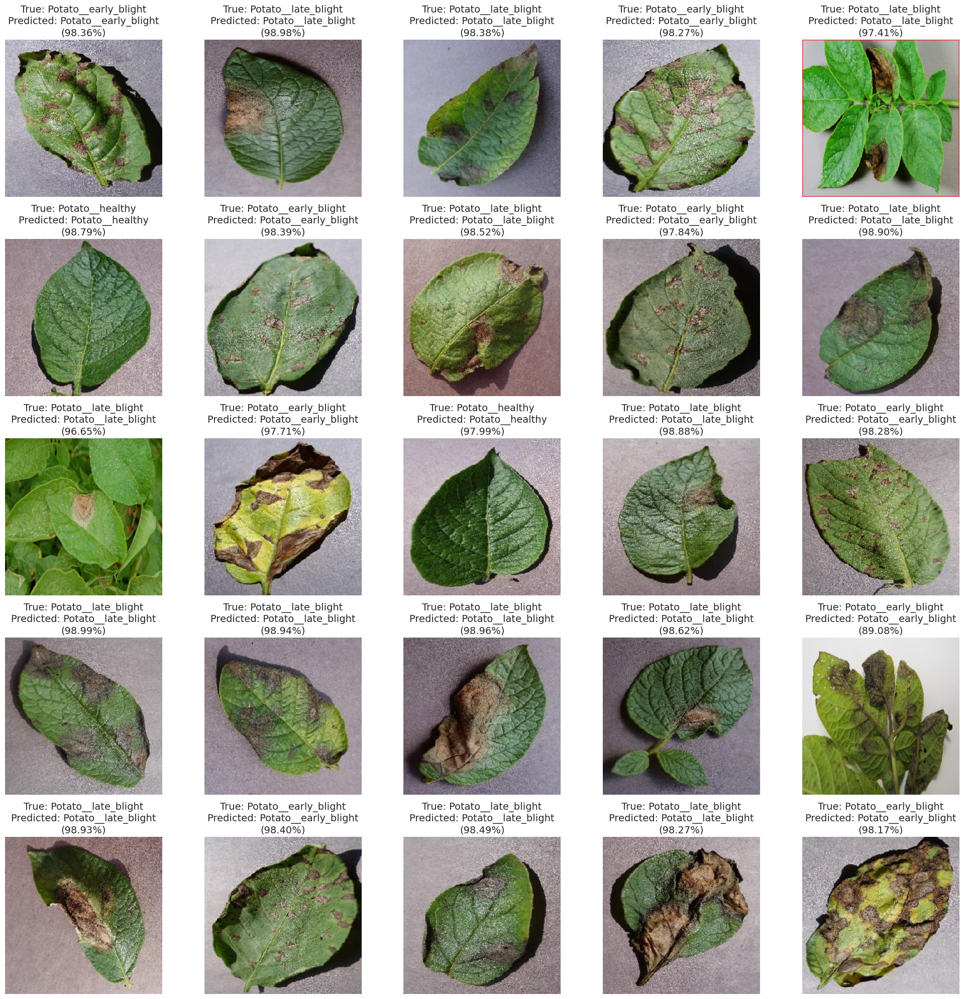

In [15]:
def show_sample_images(generator, model):
    class_dict = generator.class_indices
    classes = list(class_dict.keys())
    images, labels = next(generator)  # get a sample batch from the generator
    predictions = model.predict(images)
    predicted_labels = [classes[np.argmax(pred)] for pred in predictions]
    predicted_probs = np.max(predictions, axis=1)

    plt.figure(figsize=(20, 20))
    length = len(labels)
    if length < 25:  # show maximum of 25 images
        r = length
    else:
        r = 25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255
        plt.imshow(image)
        true_label_index = np.argmax(labels[i])
        true_class_name = classes[true_label_index]
        predicted_class_name = predicted_labels[i]
        predicted_prob = predicted_probs[i]
        plt.title(f"True: {true_class_name}\nPredicted: {predicted_class_name}\n({predicted_prob:.2%})", fontsize=14)
        plt.axis('off')

    plt.tight_layout()  # adjust subplot layout
    plt.show()

# Example usage
show_sample_images(test_generator, model)

In [17]:
model.save('Kentang-MobileNet-V5.h5')

In [18]:
score = model.evaluate(test_generator, verbose=1)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

5/5 [==============================] - 1s 127ms/step - loss: 0.1669 - accuracy: 0.9830
Test loss: 0.16693255305290222 / Test accuracy: 0.9829787015914917
